In [1]:
import os
import torch
import torch.nn as nn
import pickle
import numpy as np
import base64
from io import BytesIO
from PIL import Image
from tqdm import tqdm

# If you have the explainers_lib installed locally, keep this. 
# Otherwise, I have included a simple grouping function below.
import sys
sys.path.append(os.path.abspath('../src'))
from explainers_lib.ensemble import cfs_group_by_original_data

# Force CPU
device = torch.device('cpu')
print(f'Using device: {device}')

# ---------------------------------------------------------
# 1. MINIMAL MODEL DEFINITIONS (Decoder Only)
# ---------------------------------------------------------
class TransConvBlock(nn.Module):
    def __init__(self, in_c, out_c):
        super().__init__()
        self.block = nn.Sequential(
            nn.ConvTranspose2d(in_c, out_c, kernel_size=4, stride=2, padding=1),
            nn.BatchNorm2d(out_c),
            nn.LeakyReLU(0.2)
        )
    def forward(self, x):
        return self.block(x)

class Decoder(nn.Module):
    def __init__(self, latent_dim=128):
        super().__init__()
        self.fc = nn.Sequential(
            nn.Linear(latent_dim, 512 * 2 * 2),
            nn.Tanh()
        )
        self.decoder = nn.Sequential(
            TransConvBlock(512, 512),   # 2 → 4
            TransConvBlock(512, 512),   # 4 → 8
            TransConvBlock(512, 256),   # 8 → 16
            TransConvBlock(256, 128),   # 16 → 32
            TransConvBlock(128, 64),    # 32 → 64
            TransConvBlock(64, 32),     # 64 → 128
            nn.ConvTranspose2d(32, 3, kernel_size=3, stride=1, padding=1),
            nn.Tanh()
        )

    def forward(self, z):
        x = self.fc(z)
        x = x.view(-1, 512, 2, 2)
        x = self.decoder(x)
        return x

# Initialize and load weights
decoder = Decoder(latent_dim=128).to(device)
weights = torch.load('autoencoder_celeba_best.pth', map_location=device)

# Filter out only the decoder weights from the full autoencoder state dict
decoder_weights = {k[len('decoder.'):]: v for k, v in weights.items() if k.startswith('decoder.')}
decoder.load_state_dict(decoder_weights)
decoder.eval()

# ---------------------------------------------------------
# 2. LOAD SAVED COUNTERFACTUALS
# ---------------------------------------------------------
PICKLE_FILE_PATH = "results/evaluate_selectors_celeba_20260303_205411.pkl"

with open(PICKLE_FILE_PATH, "rb") as f:
    all_generated_cfes = pickle.load(f)

print(f"Successfully loaded {len(all_generated_cfes)} counterfactuals.")

# Group them by original instance
grouped_cfs = cfs_group_by_original_data(all_generated_cfes)

Using device: cpu
Successfully loaded 287 counterfactuals.


In [2]:
class_map = {0: "No Smile", 1: "Smile"}
metrics_to_show = ['Proximity', 'K_Feasibility(3)', 'DiscriminativePower(9)']

def image_to_base64(img_array):
    img_uint8 = np.clip(img_array * 255, 0, 255).astype(np.uint8)
    img_pil = Image.fromarray(img_uint8)
    buffered = BytesIO()
    img_pil.save(buffered, format="PNG")
    img_str = base64.b64encode(buffered.getvalue()).decode("utf-8")
    return f"data:image/png;base64,{img_str}"

def precompute_cfe_data(grouped_cfs, decoder, device, metrics_to_show):
    """Decodes images and extracts metrics into a fast, render-ready dictionary."""
    precomputed = []
    
    for orig_id, cfes in tqdm(grouped_cfs.items()):
        if not cfes: continue
        
        # 1. Process Original Image
        with torch.no_grad():
            latent_orig = torch.tensor(cfes[0].original_data, dtype=torch.float32, device=device).unsqueeze(0)
            img_orig = decoder(latent_orig).cpu().squeeze().permute(1, 2, 0).numpy()
            img_orig = (img_orig + 1) / 2
            
        orig_b64 = image_to_base64(img_orig)
        orig_label = class_map.get(cfes[0].original_class, cfes[0].original_class)
        
        cf_list = []
        
        # 2. Process CFEs
        for cf in cfes:
            with torch.no_grad():
                latent_cf = torch.tensor(cf.data, dtype=torch.float32, device=device).unsqueeze(0)
                img_cf = decoder(latent_cf).cpu().squeeze().permute(1, 2, 0).numpy()
                img_cf = (img_cf + 1) / 2
            
            cf_b64 = image_to_base64(img_cf)
            cf_label = class_map.get(cf.target_class, cf.target_class)
            
            scores = cf.metadata.get('scores', {})
            cf_metrics = {m: scores.get(m, 'N/A') for m in metrics_to_show}
            l2_dist = np.linalg.norm(cf.original_data - cf.data)
            selected_by = cf.metadata.get('selected_by', [])
            
            cf_list.append({
                'b64': cf_b64,
                'label': cf_label,
                'explainer': cf.explainer[:20],
                'metrics': cf_metrics,
                'l2': l2_dist,
                'selected_by': selected_by
            })
            
        precomputed.append({
            'orig_b64': orig_b64,
            'orig_label': orig_label,
            'cfes': cf_list
        })
        
    return precomputed

precomputed_data = precompute_cfe_data(grouped_cfs, decoder, device, metrics_to_show)

100%|██████████| 19/19 [00:17<00:00,  1.10it/s]


Original,CFE Image,Proximity,K_Feasibility(3),DiscriminativePower(9),L2 (Latent),Selected By
Class: No Smile,wachter(lambda_paramTarget: Smile,3.1758,16.5866,0.66672nd,1.8288,TOPSIS
Class: No Smile,face_explainer(mode=Target: Smile,14.5865,10.1582,0.88891st,2.5930,BalancedPoint
Class: No Smile,face_explainer(mode=Target: Smile,17.9420,8.13161st,0.66672nd,3.0693,-
Class: No Smile,face_explainer(mode=Target: Smile,15.2000,9.9237,0.66672nd,2.6962,-
Class: No Smile,face_explainer(mode=Target: Smile,18.0829,8.65342nd,0.4444,3.2417,-
Class: No Smile,face_explainer(mode=Target: Smile,15.6140,9.65083rd,0.88891st,2.8412,-
Class: No Smile,cfproto(k=5)Target: Smile,4.1197,13.2156,0.55563rd,1.19741st,-
Class: No Smile,cfproto(k=5)Target: Smile,4.2087,13.1808,0.55563rd,1.21082nd,IdealPoint
Class: No Smile,cfproto(k=5)Target: Smile,4.2559,13.1658,0.55563rd,1.21823rd,-
Class: No Smile,cfproto(k=5)Target: Smile,4.2985,13.1491,0.55563rd,1.2249,-

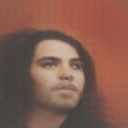
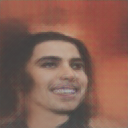
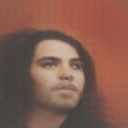
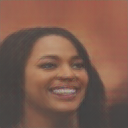
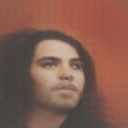
...
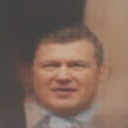
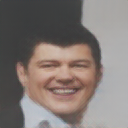
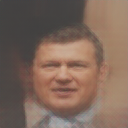
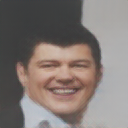
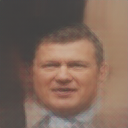

In [3]:
from IPython.display import display, HTML

def render_precomputed_html(
    precomputed_data, 
    metrics_to_show=['Proximity', 'K_Feasibility(3)', 'DiscriminativePower(9)'],
    metric_directions={
        'Proximity': 'min', 
        'K_Feasibility(3)': 'min', 
        'DiscriminativePower(9)': 'max', 
        'l2': 'min'
    }
):
    """Renders the HTML table instantly, with 1st, 2nd, and 3rd badges for metrics."""
    if not precomputed_data: return
    
    html = """
    <style>
        .cfe-wrapper { background-color: #121212; padding: 10px; border-radius: 6px; }
        details { margin-bottom: 12px; border: 1px solid #333; border-radius: 4px; font-family: sans-serif; background-color: #1e1e1e; color: #e0e0e0; }
        summary { padding: 12px; font-weight: bold; background-color: #2a2a2a; color: #ffffff; cursor: pointer; user-select: none; border-radius: 4px; }
        summary:hover { background-color: #383838; }
        .cfe-table { width: 100%; border-collapse: collapse; margin-top: 0px; color: #e0e0e0; }
        .cfe-table th, .cfe-table td { border-top: 1px solid #333; border-left: 1px solid #333; padding: 12px; text-align: center; vertical-align: middle; }
        .cfe-table th { background-color: #222; font-size: 13px; font-weight: 600; color: #fff; }
        
        .cfe-image-wrapper { position: relative; display: inline-block; }
        .cfe-image-wrapper img { width: 100px; border-radius: 4px; transition: transform 0.2s ease-in-out, box-shadow 0.2s ease-in-out; transform-origin: center center; z-index: 1; }
        .cfe-image-wrapper:hover img { transform: scale(3.5); z-index: 100; position: relative; box-shadow: 0 10px 25px rgba(0,0,0,0.8); }
        
        .metric-val { font-family: monospace; font-size: 13px; color: #82aaff; white-space: nowrap; }
        .meta-text { font-size: 12px; color: #aaa; margin-top: 6px; }
        .orig-cell { background-color: #1a1a1a; }
        
        /* Badges for 1st, 2nd, 3rd */
        .badge { font-family: sans-serif; font-size: 10px; font-weight: bold; padding: 2px 5px; border-radius: 4px; margin-left: 6px; color: #000; vertical-align: middle;}
        .rank-1 { background-color: #ffd700; box-shadow: 0 0 5px rgba(255, 215, 0, 0.4); } /* Gold */
        .rank-2 { background-color: #e0e0e0; } /* Silver */
        .rank-3 { background-color: #cd7f32; } /* Bronze */
    </style>
    <div class="cfe-wrapper">
    """
    
    metrics_headers = "".join([f"<th>{m}</th>" for m in metrics_to_show])
    
    for instance_idx, data in enumerate(precomputed_data):
        n_cfes = len(data['cfes'])
        
        # --- Pre-calculate Rankings for this Instance ---
        # We store the top 3 unique values for each metric so we can compare against them later
        rankings = {}
        
        # 1. Standard metrics
        for m in metrics_to_show:
            vals = [cf['metrics'].get(m) for cf in data['cfes'] if isinstance(cf['metrics'].get(m), (int, float))]
            if vals:
                is_max = (metric_directions.get(m, 'max') == 'max')
                unique_sorted_vals = sorted(list(set(vals)), reverse=is_max)
                rankings[m] = unique_sorted_vals[:3] # Keep only top 3
            else:
                rankings[m] = []
                
        # 2. L2 Latent metric
        l2_vals = [cf['l2'] for cf in data['cfes']]
        is_max_l2 = (metric_directions.get('l2', 'min') == 'max')
        rankings['l2'] = sorted(list(set(l2_vals)), reverse=is_max_l2)[:3]
        # ------------------------------------------------
        
        html += f"""
        <details>
            <summary>Original Instance #{instance_idx} — {n_cfes} Counterfactuals</summary>
            <table class="cfe-table">
                <thead>
                    <tr>
                        <th>Original</th>
                        <th>CFE Image</th>
                        {metrics_headers}
                        <th>L2 (Latent)</th>
                        <th>Selected By</th>
                    </tr>
                </thead>
                <tbody>
        """
        
        for cf in data['cfes']:
            metrics_cells = ""
            for m in metrics_to_show:
                val = cf['metrics'].get(m, 'N/A')
                val_str = f"{val:.4f}" if isinstance(val, (float, int)) else str(val)
                
                # Assign badges
                badge_html = ""
                if isinstance(val, (float, int)) and val in rankings.get(m, []):
                    rank = rankings[m].index(val) + 1
                    suffix = "st" if rank == 1 else "nd" if rank == 2 else "rd"
                    badge_html = f'<span class="badge rank-{rank}">{rank}{suffix}</span>'
                
                metrics_cells += f'<td class="metric-val">{val_str}{badge_html}</td>'
            
            # L2 Ranking
            l2_val = cf['l2']
            l2_badge = ""
            if l2_val in rankings['l2']:
                l2_rank = rankings['l2'].index(l2_val) + 1
                suffix = "st" if l2_rank == 1 else "nd" if l2_rank == 2 else "rd"
                l2_badge = f'<span class="badge rank-{l2_rank}">{l2_rank}{suffix}</span>'
                
            selected_str = "<br>".join(cf['selected_by']) if cf['selected_by'] else "<span style='color:#555'>-</span>"
            selected_cell = f'<td style="font-size: 13px; font-weight: bold; color: #c3e88d;">{selected_str}</td>'
            
            html += f"""
            <tr>
                <td class="orig-cell">
                    <div class="cfe-image-wrapper">
                        <img src="{data['orig_b64']}" />
                    </div>
                    <div class="meta-text"><strong>Class:</strong> {data['orig_label']}</div>
                </td>
                <td>
                    <div class="cfe-image-wrapper">
                        <img src="{cf['b64']}" />
                    </div>
                    <div class="meta-text"><strong>{cf['explainer']}</strong><br>Target: {cf['label']}</div>
                </td>
                {metrics_cells}
                <td class="metric-val">{l2_val:.4f}{l2_badge}</td>
                {selected_cell}
            </tr>
            """
            
        html += "</tbody></table></details>"
        
    html += "</div></div>"
    display(HTML(html))

# Render it instantly!
render_precomputed_html(precomputed_data)

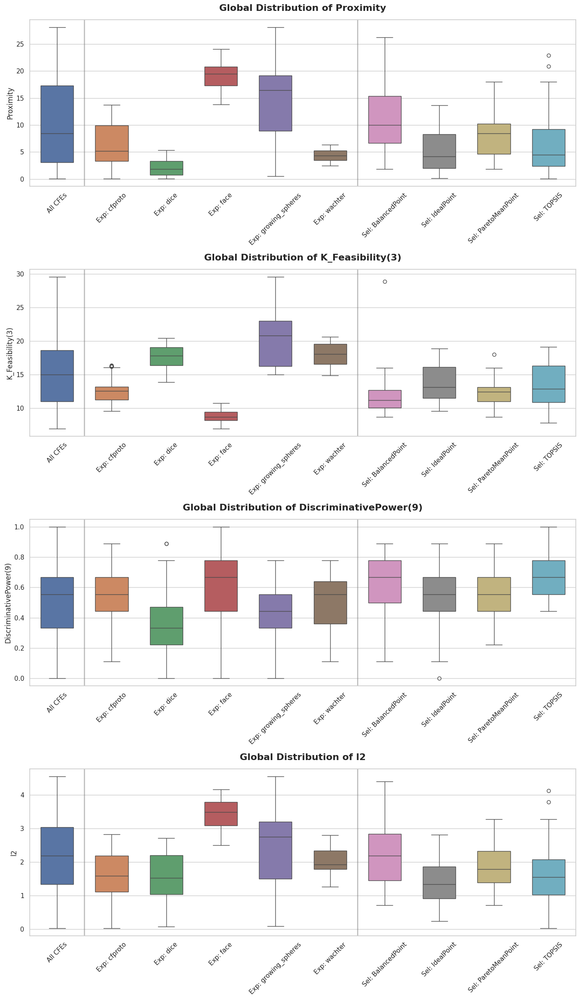

In [4]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np

def plot_global_metric_boxplots(precomputed_data, metrics_to_plot=['Proximity', 'K_Feasibility(3)', 'DiscriminativePower(9)', 'l2']):
    """Creates matched-axis boxplots to compare global metric trends with default styling."""
    
    records = []
    
    # 1. Flatten the data into a Pandas DataFrame
    for data in precomputed_data:
        for cf in data['cfes']:
            # Safely extract metrics
            row_metrics = {}
            is_valid = True
            for m in metrics_to_plot:
                val = cf.get('l2') if m == 'l2' else cf['metrics'].get(m)
                try:
                    row_metrics[m] = float(val)
                    if np.isnan(row_metrics[m]): is_valid = False
                except (ValueError, TypeError):
                    is_valid = False
            
            if not is_valid: continue
            
            explainer_name = cf['explainer'].split('(')[0].replace('_explainer', '')
            
            # Add to 'All CFEs' baseline
            records.append({'Group': 'All CFEs', 'Category': 'Baseline', **row_metrics})
            
            # Add to the specific Explainer that generated it
            records.append({'Group': f"Exp: {explainer_name}", 'Category': 'Explainers', **row_metrics})
            
            # Add to any Selectors that picked it
            for selector in cf.get('selected_by', []):
                records.append({'Group': f"Sel: {selector}", 'Category': 'Selectors', **row_metrics})
                
    df = pd.DataFrame(records)
    
    if df.empty:
        print("No valid numeric data found to plot.")
        return

    # Sort groups so they appear in a logical order on the X-axis
    df = df.sort_values(by=['Category', 'Group'])

    # 2. Plotting (Default Style)
    # Reset to default style just in case dark mode is still active in the notebook
    plt.style.use('default') 
    sns.set_theme(style="whitegrid") # Clean default seaborn theme
    
    fig, axes = plt.subplots(len(metrics_to_plot), 1, figsize=(14, 6 * len(metrics_to_plot)))
    
    if len(metrics_to_plot) == 1: axes = [axes]
    
    for i, m in enumerate(metrics_to_plot):
        ax = axes[i]
        
        # Draw the boxplot (with hue and legend=False to fix the FutureWarning)
        sns.boxplot(
            data=df, 
            x='Group', 
            y=m, 
            hue='Group', 
            legend=False, 
            ax=ax, 
            showfliers=True, 
            width=0.6
        )
        
        # Formatting
        ax.set_title(f"Global Distribution of {m}", fontsize=16, fontweight='bold', pad=15)
        ax.set_xlabel("")
        ax.set_ylabel(m, fontsize=12)
        ax.tick_params(axis='x', rotation=45, labelsize=11)
        
        # Add vertical lines to separate the categories visually
        baseline_count = len(df[df['Category'] == 'Baseline']['Group'].unique())
        explainer_count = len(df[df['Category'] == 'Explainers']['Group'].unique())
        
        ax.axvline(x=baseline_count - 0.5, color='gray', linestyle='-', linewidth=2, alpha=0.5)
        ax.axvline(x=baseline_count + explainer_count - 0.5, color='gray', linestyle='-', linewidth=2, alpha=0.5)

    plt.tight_layout()
    plt.show()

# Run the plotting function
plot_global_metric_boxplots(precomputed_data)

In [5]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
import ipywidgets as widgets
from IPython.display import display, clear_output

def interactive_local_boxplots(precomputed_data, metrics_to_plot=['Proximity', 'K_Feasibility(3)', 'DiscriminativePower(9)', 'l2']):
    """Creates an interactive dropdown to view matched-axis boxplots for a single original instance."""
    
    def plot_instance(instance_idx):
        data = precomputed_data[instance_idx]
        records = []
        
        # Extract data for this single instance
        for cf in data['cfes']:
            row_metrics = {}
            is_valid = True
            for m in metrics_to_plot:
                val = cf.get('l2') if m == 'l2' else cf['metrics'].get(m)
                try:
                    row_metrics[m] = float(val)
                    if np.isnan(row_metrics[m]): is_valid = False
                except (ValueError, TypeError):
                    is_valid = False
            
            if not is_valid: continue
            
            explainer_name = cf['explainer'].split('(')[0].replace('_explainer', '')
            
            records.append({'Group': 'All CFEs', 'Category': 'Baseline', **row_metrics})
            records.append({'Group': f"Exp: {explainer_name}", 'Category': 'Explainers', **row_metrics})
            
            for selector in cf.get('selected_by', []):
                records.append({'Group': f"Sel: {selector}", 'Category': 'Selectors', **row_metrics})
                
        df = pd.DataFrame(records)
        
        if df.empty:
            print(f"No valid numeric data found for Instance #{instance_idx}.")
            return

        df = df.sort_values(by=['Category', 'Group'])

        # Plotting
        plt.style.use('default') 
        sns.set_theme(style="whitegrid")

        fig, axes = plt.subplots(len(metrics_to_plot), 1, figsize=(14, 5 * len(metrics_to_plot)))
        if len(metrics_to_plot) == 1: axes = [axes]
        
        for i, m in enumerate(metrics_to_plot):
            ax = axes[i]
            
            # Draw transparent boxplots
            sns.boxplot(
                data=df, x='Group', y=m, hue='Group', legend=False, 
                ax=ax, showfliers=False, width=0.6, boxprops={'alpha': 0.4}
            )
            
            # Overlay actual points (stripplot) so small sample sizes are still visible
            sns.stripplot(
                data=df, x='Group', y=m, hue='Group', legend=False, 
                ax=ax, jitter=True, size=7, linewidth=1, alpha=0.9
            )
            
            ax.set_title(f"Instance #{instance_idx} (Class: {data['orig_label']}) - Distribution of {m}", fontsize=15, fontweight='bold', pad=10)
            ax.set_xlabel("")
            ax.set_ylabel(m, fontsize=12)
            ax.tick_params(axis='x', rotation=45, labelsize=11)
            
            baseline_count = len(df[df['Category'] == 'Baseline']['Group'].unique())
            explainer_count = len(df[df['Category'] == 'Explainers']['Group'].unique())
            ax.axvline(x=baseline_count - 0.5, color='gray', linestyle='-', linewidth=2, alpha=0.5)
            ax.axvline(x=baseline_count + explainer_count - 0.5, color='gray', linestyle='-', linewidth=2, alpha=0.5)

        plt.tight_layout()
        plt.show()

    # Create the Dropdown widget
    options = [(f"Instance #{i} (Label: {d['orig_label']} | {len(d['cfes'])} CFEs)", i) for i, d in enumerate(precomputed_data)]
    dropdown = widgets.Dropdown(options=options, description='Select Data:', layout={'width': 'max-content'})
    
    # Use interactive_output to link the dropdown to the plot
    out = widgets.interactive_output(plot_instance, {'instance_idx': dropdown})
    
    # Display the widget and the output area
    display(dropdown, out)

# Run the interactive widget
interactive_local_boxplots(precomputed_data)

Dropdown(description='Select Data:', layout=Layout(width='max-content'), options=(('Instance #0 (Label: No Smi…

Output()

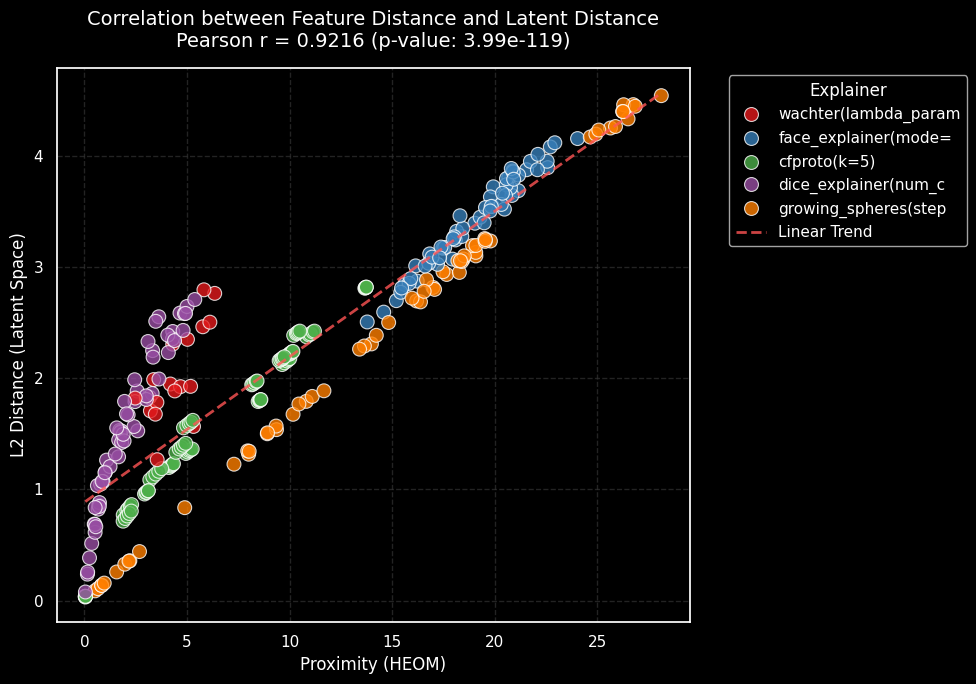

In [6]:
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
import pandas as pd
from scipy.stats import pearsonr

def plot_distance_correlation_fixed(precomputed_data):
    """Plots Proximity vs L2 for ALL explainers by safely casting data types."""
    
    proximity_vals = []
    l2_vals = []
    explainers = []
    
    for data in precomputed_data:
        for cf in data['cfes']:
            prox = cf['metrics'].get('Proximity', 'N/A')
            l2 = cf['l2']
            
            # Safely attempt to convert to standard Python float
            try:
                prox_val = float(prox)
                l2_val = float(l2)
                
                # Make sure it's an actual number and not NaN
                if not np.isnan(prox_val) and not np.isnan(l2_val):
                    proximity_vals.append(prox_val)
                    l2_vals.append(l2_val)
                    explainers.append(cf['explainer'])
            except (ValueError, TypeError):
                # Skips if prox is literally 'N/A' or a string that can't be cast
                continue
                
    if not proximity_vals:
        print("No valid numeric scores found to plot.")
        return

    # Calculate Pearson Correlation
    corr_coef, p_value = pearsonr(proximity_vals, l2_vals)
    
    # Create DataFrame
    df_plot = pd.DataFrame({
        'Proximity (HEOM)': proximity_vals,
        'L2 Distance (Latent)': l2_vals,
        'Explainer': explainers
    })
    
    # Plotting
    plt.style.use('dark_background')
    fig, ax = plt.subplots(figsize=(10, 7))
    
    sns.scatterplot(
        data=df_plot, 
        x='Proximity (HEOM)', 
        y='L2 Distance (Latent)', 
        hue='Explainer', 
        palette='Set1', # Switched to Set1 for more distinct colors
        s=100, 
        alpha=0.8,
        edgecolor='w',
        ax=ax
    )
    
    # Linear trendline
    m, b = np.polyfit(proximity_vals, l2_vals, 1)
    x_trend = np.linspace(min(proximity_vals), max(proximity_vals), 100)
    ax.plot(x_trend, m * x_trend + b, color='#ff5555', linestyle='--', linewidth=2, alpha=0.8, label='Linear Trend')
    
    ax.set_title(f"Correlation between Feature Distance and Latent Distance\nPearson r = {corr_coef:.4f} (p-value: {p_value:.2e})", fontsize=14, pad=15)
    ax.set_xlabel("Proximity (HEOM)", fontsize=12)
    ax.set_ylabel("L2 Distance (Latent Space)", fontsize=12)
    ax.grid(True, color='#333333', linestyle='--', alpha=0.7)
    
    plt.legend(title='Explainer', bbox_to_anchor=(1.05, 1), loc='upper left')
    plt.tight_layout()
    plt.show()

# Run the fixed visualization
plot_distance_correlation_fixed(precomputed_data)

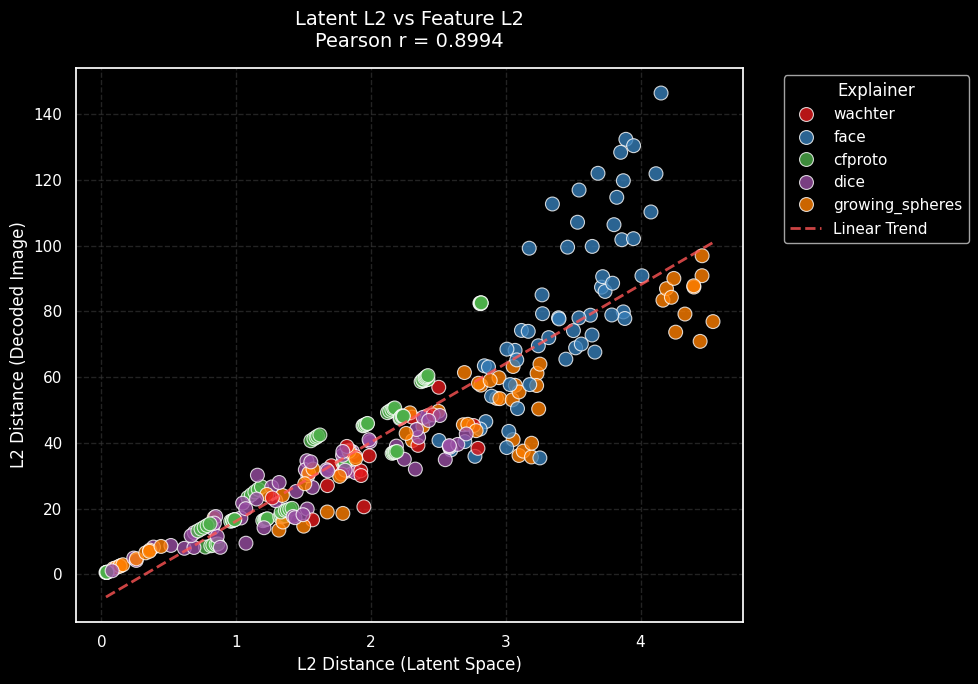

In [7]:
import torch
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from scipy.stats import pearsonr

def plot_latent_vs_feature_l2(grouped_cfs, decoder, device):
    """Calculates L2 in both latent and feature (decoded) spaces and plots the correlation."""
    latent_l2_vals = []
    feature_l2_vals = []
    explainers = []
    
    decoder.eval()
    with torch.no_grad():
        for orig_id, cfes in grouped_cfs.items():
            if not cfes: continue
            
            # 1. Get original latent and decode it to feature space (image)
            latent_orig = torch.tensor(cfes[0].original_data, dtype=torch.float32, device=device).unsqueeze(0)
            img_orig = decoder(latent_orig).cpu().squeeze().numpy()
            
            for cf in cfes:
                # 2. Get CF latent and decode it to feature space
                latent_cf = torch.tensor(cf.data, dtype=torch.float32, device=device).unsqueeze(0)
                img_cf = decoder(latent_cf).cpu().squeeze().numpy()
                
                # 3. Calculate Latent L2 (Euclidean distance of the 128-dim vectors)
                latent_l2 = np.linalg.norm(cf.original_data - cf.data)
                
                # 4. Calculate Feature L2 (Euclidean distance of the flattened images)
                feature_l2 = np.linalg.norm(img_orig - img_cf)
                
                latent_l2_vals.append(latent_l2)
                feature_l2_vals.append(feature_l2)
                
                # Clean up explainer names for the legend
                explainers.append(cf.explainer.split('(')[0].replace('_explainer', ''))

    if not latent_l2_vals:
        print("No data found to plot.")
        return
        
    # Calculate Pearson Correlation
    corr_coef, p_value = pearsonr(latent_l2_vals, feature_l2_vals)
    
    # Create DataFrame for Seaborn
    df_plot = pd.DataFrame({
        'Latent L2 Distance': latent_l2_vals,
        'Feature L2 Distance (Pixels)': feature_l2_vals,
        'Explainer': explainers
    })
    
    # Plotting
    plt.style.use('dark_background')
    fig, ax = plt.subplots(figsize=(10, 7))
    
    sns.scatterplot(
        data=df_plot, 
        x='Latent L2 Distance', 
        y='Feature L2 Distance (Pixels)', 
        hue='Explainer', 
        palette='Set1',
        s=100, 
        alpha=0.8,
        edgecolor='w',
        ax=ax
    )
    
    # Trendline
    m, b = np.polyfit(latent_l2_vals, feature_l2_vals, 1)
    x_trend = np.linspace(min(latent_l2_vals), max(latent_l2_vals), 100)
    ax.plot(x_trend, m * x_trend + b, color='#ff5555', linestyle='--', linewidth=2, alpha=0.8, label='Linear Trend')
    
    ax.set_title(f"Latent L2 vs Feature L2\nPearson r = {corr_coef:.4f}", fontsize=14, pad=15)
    ax.set_xlabel("L2 Distance (Latent Space)", fontsize=12)
    ax.set_ylabel("L2 Distance (Decoded Image)", fontsize=12)
    ax.grid(True, color='#333333', linestyle='--', alpha=0.7)
    
    plt.legend(title='Explainer', bbox_to_anchor=(1.05, 1), loc='upper left')
    plt.tight_layout()
    plt.show()

# Run the visualization
plot_latent_vs_feature_l2(grouped_cfs, decoder, device)